# **Bank Deposito Subscribe**

The data is related with direct marketing campaigns of a Portuguese banking institution. The marketing campaigns were based on phone calls. Often, more than one contact to the same client was required, in order to access if the product (bank term deposit) would be ('yes') or not ('no') subscribed.

# **Import Library and Dataset**

In [ ]:
# number wrangling and data manipulation libraries
import numpy as np
import pandas as pd

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
sns.set_style("darkgrid")
plt.style.use('ggplot')

from pandas_profiling import ProfileReport

#preprocess
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import RobustScaler
from imblearn.over_sampling import SMOTE 

#model
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost.sklearn import XGBClassifier

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, KFold
from sklearn.feature_selection import SelectFromModel

#metrics
import sklearn.metrics as metrics
import math
from sklearn.metrics import classification_report, f1_score

# Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# warnings
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore")

pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 10)
pd.set_option("display.width", 1000)

In [ ]:
df_train = pd.read_csv("train.csv")
df_test = pd.read_csv("test.csv")
df_train

,id,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,is_subscribed
0,0,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93994.0,-36.4,4857.0,5191.0,0
1,1,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93994.0,-36.4,4857.0,5191.0,0
2,2,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93994.0,-36.4,4857.0,5191.0,0
3,3,25,services,single,high.school,no,yes,no,telephone,may,mon,50,1,999,0,nonexistent,1.1,93994.0,-36.4,4857.0,5191.0,0
4,4,29,blue-collar,single,high.school,no,no,yes,telephone,may,mon,137,1,999,0,nonexistent,1.1,93994.0,-36.4,4857.0,5191.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24626,24626,64,retired,divorced,professional.course,no,yes,no,cellular,nov,fri,151,3,999,0,nonexistent,-1.1,94767.0,-50.8,1028.0,4963.6,0
24627,24627,36,admin.,married,university.degree,no,no,no,cellular,nov,fri,254,2,999,0,nonexistent,-1.1,94767.0,-50.8,1028.0,4963.6,0
24628,24628,29,unemployed,single,basic.4y,no,yes,no,cellular,nov,fri,112,1,9,1,success,-1.1,94767.0,-50.8,1028.0,4963.6,0
24629,24629,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,383,1,999,0,nonexistent,-1.1,94767.0,-50.8,1028.0,4963.6,0


# **Exploratory Data Analysis**

In [ ]:
profile = ProfileReport(df_train, title='Pandas Profiling Report', explorative=True)
profile

Render HTML: 100%|██████████| 1/1 [00:07<00:00,  7.08s/it]


## **Checking Missing Value**

<AxesSubplot:>

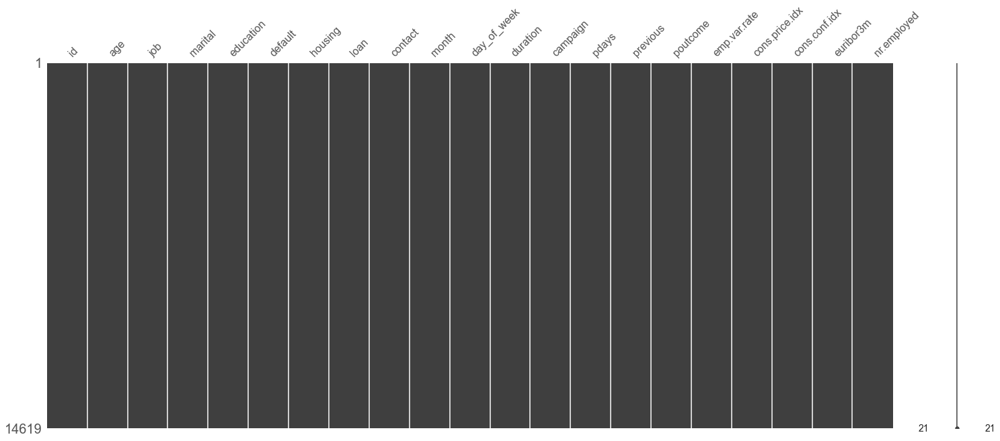

In [ ]:
msno.matrix(df_train)

<AxesSubplot:>

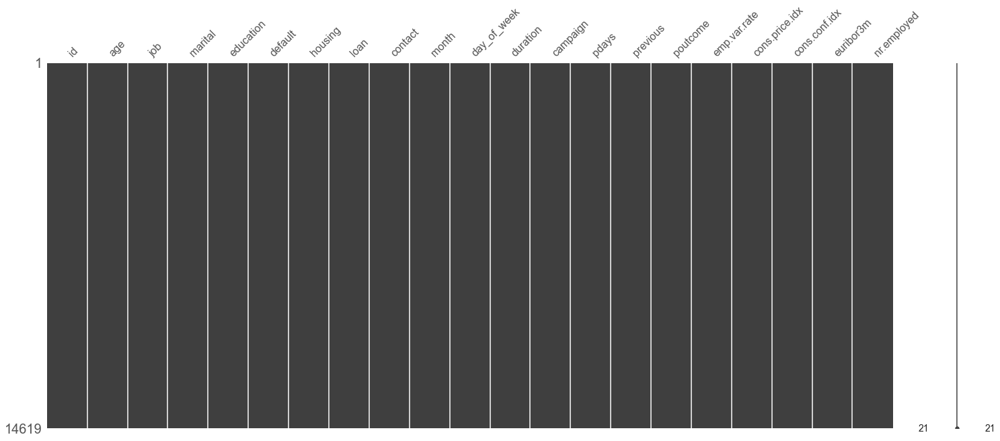

In [ ]:
msno.matrix(df_test)

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24631 entries, 0 to 24630
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              24631 non-null  int64  
 1   age             24631 non-null  int64  
 2   job             24631 non-null  object 
 3   marital         24631 non-null  object 
 4   education       24631 non-null  object 
 5   default         24631 non-null  object 
 6   housing         24631 non-null  object 
 7   loan            24631 non-null  object 
 8   contact         24631 non-null  object 
 9   month           24631 non-null  object 
 10  day_of_week     24631 non-null  object 
 11  duration        24631 non-null  int64  
 12  campaign        24631 non-null  int64  
 13  pdays           24631 non-null  int64  
 14  previous        24631 non-null  int64  
 15  poutcome        24631 non-null  object 
 16  emp.var.rate    24631 non-null  float64
 17  cons.price.idx  24631 non-null 

In [ ]:
df_train.describe()

,id,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,is_subscribed
count,24631.000000,24631.000000,24631.000000,24631.000000,24631.000000,24631.000000,24631.000000,24631.000000,24631.000000,24631.000000,24631.000000,24631.000000
mean,12315.000000,39.954772,259.363038,2.558686,962.477407,0.172384,0.084406,85370.206293,-40.537266,3187.914225,5167.292002,0.111607
std,7110.501576,10.421899,261.190493,2.747936,186.901496,0.497744,1.569915,26519.502818,4.611337,2084.196960,72.228149,0.314889
min,0.000000,17.000000,0.000000,1.000000,0.000000,0.000000,-3.400000,93.200000,-50.800000,0.634000,4963.600000,0.000000
25%,6157.500000,32.000000,102.000000,1.000000,999.000000,0.000000,-1.800000,92893.000000,-42.700000,1281.000000,5099.100000,0.000000
50%,12315.000000,38.000000,180.000000,2.000000,999.000000,0.000000,1.100000,93749.000000,-41.800000,4856.000000,5191.000000,0.000000
75%,18472.500000,47.000000,322.000000,3.000000,999.000000,0.000000,1.400000,93994.000000,-36.400000,4961.000000,5228.100000,0.000000
max,24630.000000,98.000000,4918.000000,56.000000,999.000000,7.000000,1.400000,94767.000000,-26.900000,5045.000000,5228.100000,1.000000


## **Heatmap Correlation**

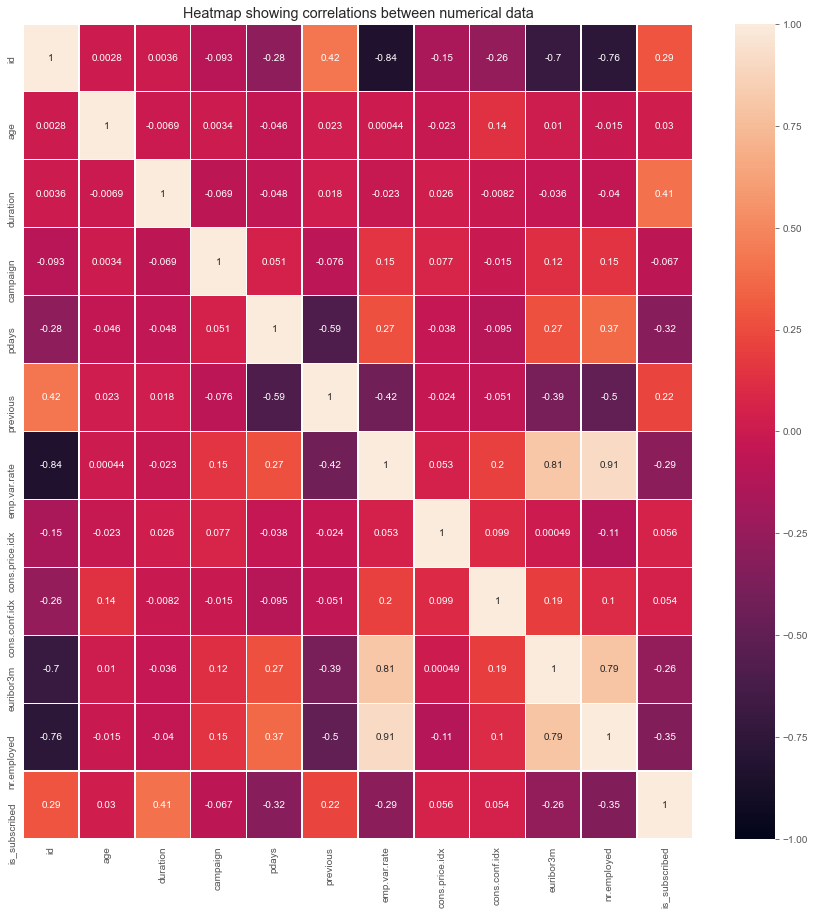

In [ ]:
plt.figure(figsize=(15,15))  
sns.heatmap(df_train.corr(),annot=True,vmin=-1.0,vmax=1.0,linewidths=.5, cmap="rocket")
plt.title('Heatmap showing correlations between numerical data')
plt.show()

Numeric and Categorical feature

In [ ]:
numeric_df = df_train.select_dtypes(include=np.number)
cat_df = df_train.select_dtypes(include='object')

## **Distribution Size**

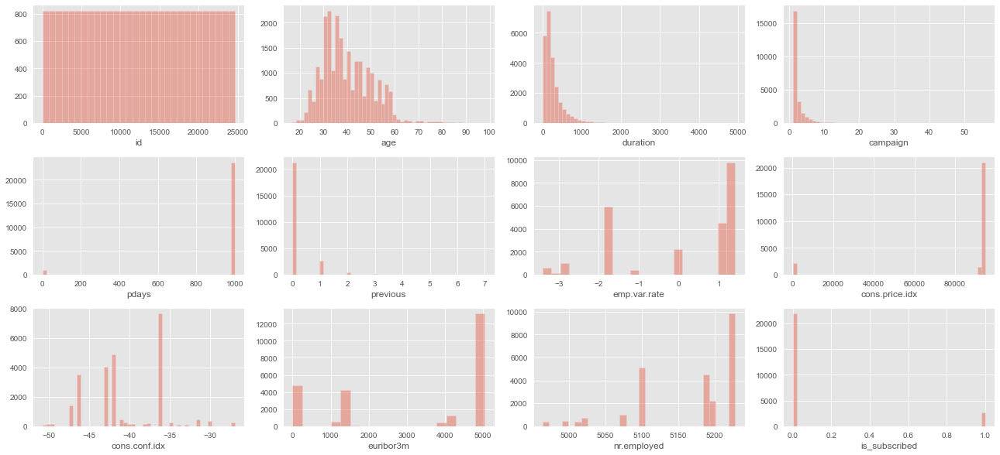

In [ ]:
fig = plt.figure(figsize=(18,16))
for index,col in enumerate(numeric_df):
    plt.subplot(6,4,index+1)
    sns.distplot(numeric_df.loc[:,col].dropna(), kde=False)
fig.tight_layout(pad=1.0)

## **Categorical Visualization**

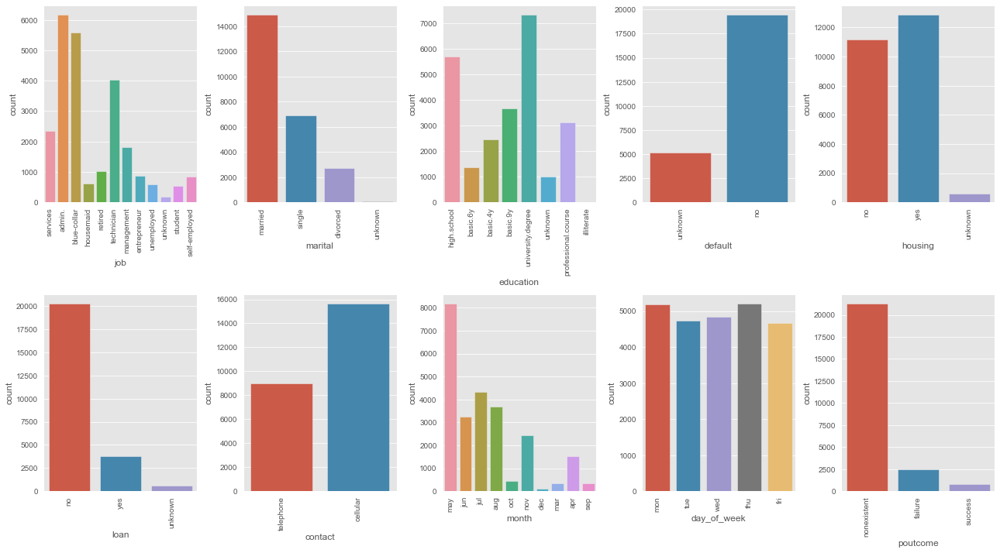

In [ ]:
fig = plt.figure(figsize=(18,10))
for index in range(len(cat_df.columns)):
    plt.subplot(2,5,index+1)
    sns.countplot(x=cat_df.iloc[:,index], data=cat_df.dropna())
    plt.xticks(rotation=90)
fig.tight_layout(pad=1.0)

In [ ]:
df_train[df_train['pdays'] < 200]

,id,age,job,marital,education,default,housing,loan,contact,month,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,is_subscribed
14524,14524,48,management,married,university.degree,no,yes,no,cellular,nov,...,1,4,1,success,-0.1,93.2,-42.0,4191.0,5195.8,0
14533,14533,42,technician,married,professional.course,unknown,yes,no,cellular,nov,...,1,4,1,success,-0.1,93.2,-42.0,4191.0,5195.8,0
14610,14610,50,entrepreneur,married,university.degree,unknown,yes,no,cellular,nov,...,1,3,1,success,-0.1,93.2,-42.0,4191.0,5195.8,0
14745,14745,32,blue-collar,married,basic.9y,no,no,no,cellular,nov,...,2,5,1,success,-0.1,93.2,-42.0,4191.0,5195.8,1
14848,14848,31,entrepreneur,divorced,basic.4y,no,no,no,cellular,nov,...,1,5,1,success,-0.1,93.2,-42.0,4153.0,5195.8,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24608,24608,41,technician,married,professional.course,no,no,no,cellular,nov,...,2,6,1,success,-1.1,94767.0,-50.8,1039.0,4963.6,1
24613,24613,35,technician,divorced,basic.4y,no,yes,no,cellular,nov,...,1,9,4,success,-1.1,94767.0,-50.8,1035.0,4963.6,1
24615,24615,60,blue-collar,married,basic.4y,no,yes,no,cellular,nov,...,2,4,1,success,-1.1,94767.0,-50.8,1035.0,4963.6,0
24625,24625,62,retired,married,university.degree,no,yes,no,cellular,nov,...,1,1,6,success,-1.1,94767.0,-50.8,1031.0,4963.6,1


In [ ]:
def cont(data,column):
    print(data[column].describe())
    plt.figure(figsize=(13,5))
    plt.subplot(1,2,1)
    sns.kdeplot(data[column][data['is_subscribed']==0],legend=False)
    sns.kdeplot(data[column][data['is_subscribed']==1],legend=False)
    plt.subplot(1,2,2)
    sns.boxplot(y=data[column],x=data['is_subscribed'])
    
def disc(data,column,ukuran=(6.4, 10)):
    plt.figure(figsize=ukuran)
    plt.subplot(2,1,1)
    sns.countplot(data[column], hue=data['is_subscribed'])
    ratio = [data[column][(data[column]==i)&(data['is_subscribed']==1)].count()/data[column][(data[column]==i)&(data['is_subscribed']==0)].count() for i in data[column].unique()]
    plt.subplot(2,1,2)
    sns.barplot(x=data[column].unique(),y=ratio,palette='Set2')


## **Discrete Feature**

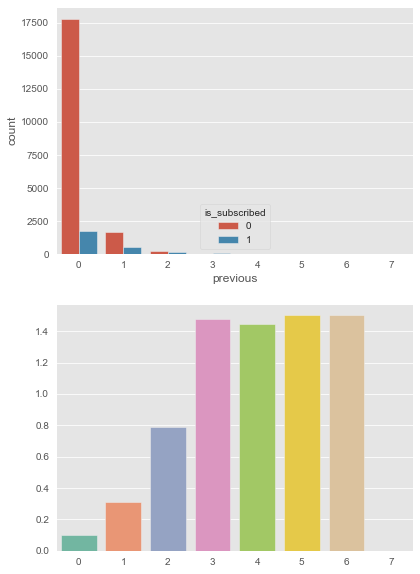

In [ ]:
disc(df_train, 'previous')

## **Continues Feature**

count    24631.000000
mean        39.954772
std         10.421899
min         17.000000
25%         32.000000
50%         38.000000
75%         47.000000
max         98.000000
Name: age, dtype: float64


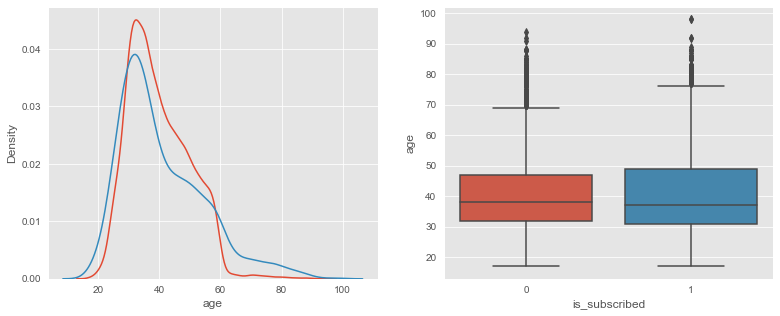

In [ ]:
cont(df_train,'age')

count    22460.000000
mean       960.187667
std        192.433820
min          0.000000
25%        999.000000
50%        999.000000
75%        999.000000
max        999.000000
Name: pdays, dtype: float64


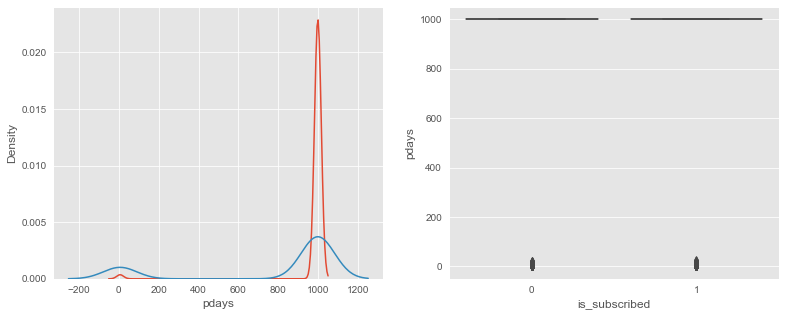

In [ ]:
cont(df_train,'pdays')

count    24631.000000
mean     85370.206293
std      26519.502818
min         93.200000
25%      92893.000000
50%      93749.000000
75%      93994.000000
max      94767.000000
Name: cons.price.idx, dtype: float64


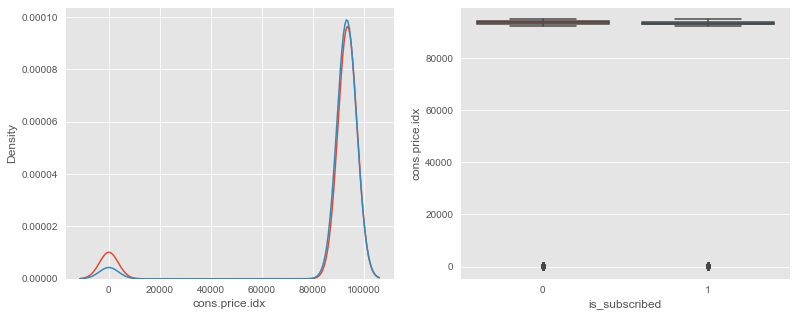

In [ ]:
cont(df_train,'cons.price.idx')

count    24631.000000
mean         0.084406
std          1.569915
min         -3.400000
25%         -1.800000
50%          1.100000
75%          1.400000
max          1.400000
Name: emp.var.rate, dtype: float64


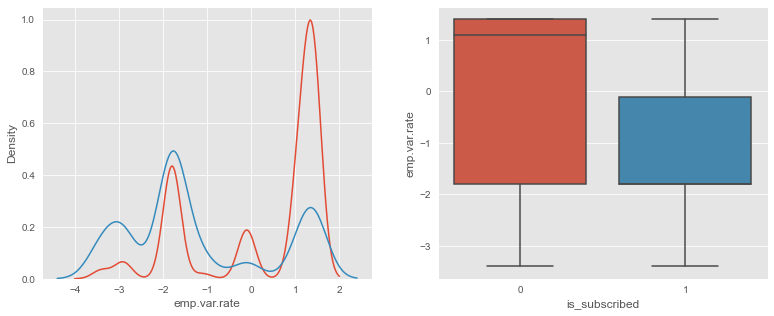

In [ ]:
cont(df_train,'emp.var.rate')

count    24631.000000
mean      3187.914225
std       2084.196960
min          0.634000
25%       1281.000000
50%       4856.000000
75%       4961.000000
max       5045.000000
Name: euribor3m, dtype: float64


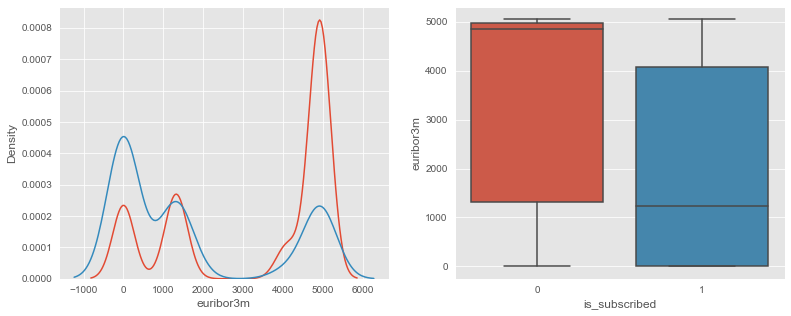

In [ ]:
cont(df_train,'euribor3m')

# **Preprocessing**

## **Feature Engineering**

In [ ]:
df_train = df_train.drop(df_train[df_train['cons.price.idx'] < 20000].index)
df_train['pdays'] = df_train['pdays'].replace({999:0})
df_test['pdays'] = df_test['pdays'].replace({999:0})

count    22460.000000
mean     93613.143989
std        594.650221
min      92201.000000
25%      93075.000000
50%      93918.000000
75%      93994.000000
max      94767.000000
Name: cons.price.idx, dtype: float64


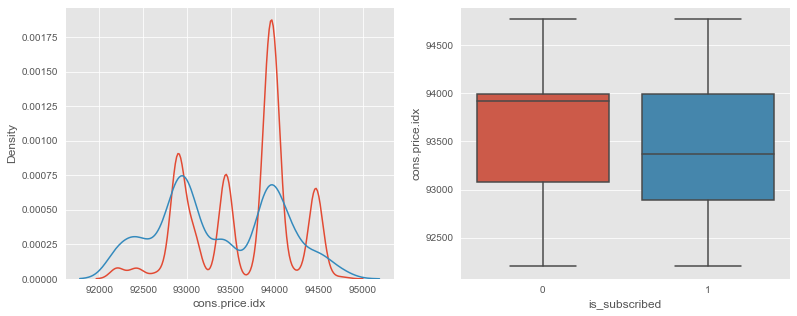

In [ ]:
cont(df_train,'cons.price.idx')

## **Data Splitting**

In [ ]:
# List of features
num_features = ["age", "duration", "campaign", "pdays", "previous", "emp.var.rate", 
                "cons.price.idx", "cons.conf.idx","euribor3m", "nr.employed"]

ohe_features = ["job", "marital", "housing", "loan",
                "contact","default", "poutcome"]

ord_features = ["education", "month", "day_of_week"]


X = df_train.drop(columns=["id", "is_subscribed" ], axis=1)
y = df_train["is_subscribed"]
X_train, X_val, y_train, y_val = train_test_split(X, y,train_size=0.8, stratify=y, random_state=42)

id_test = df_test['id']
X_test = df_test.drop(columns="id", axis=1)

X_train

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
12651,34,admin.,single,university.degree,unknown,no,yes,cellular,aug,mon,27,12,0,0,nonexistent,1.4,93444.0,-36.1,4963.0,5228.1
3586,48,technician,married,basic.6y,no,no,yes,telephone,may,tue,175,1,0,0,nonexistent,1.1,93994.0,-36.4,4857.0,5191.0
5668,25,technician,single,high.school,no,yes,yes,telephone,jun,mon,249,2,0,0,nonexistent,1.4,94465.0,-41.8,4961.0,5228.1
5036,31,blue-collar,single,basic.9y,no,no,no,telephone,jun,wed,767,2,0,0,nonexistent,1.4,94465.0,-41.8,4864.0,5228.1
19713,33,blue-collar,married,basic.4y,no,no,no,cellular,may,mon,1388,2,0,0,nonexistent,-1.8,92893.0,-46.2,1299.0,5099.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1504,45,admin.,married,basic.9y,unknown,yes,no,telephone,may,tue,109,1,0,0,nonexistent,1.1,93994.0,-36.4,4856.0,5191.0
13873,55,blue-collar,married,basic.9y,no,yes,no,cellular,aug,tue,209,4,0,0,nonexistent,1.4,93444.0,-36.1,4965.0,5228.1
6221,37,blue-collar,single,high.school,no,no,no,telephone,jun,tue,117,3,0,0,nonexistent,1.4,94465.0,-41.8,4961.0,5228.1
6407,43,technician,single,professional.course,no,unknown,unknown,telephone,jun,wed,35,3,0,0,nonexistent,1.4,94465.0,-41.8,4962.0,5228.1


## **Standard Scalling**

In [ ]:
# Standard scaling

st = StandardScaler()
X_train[num_features] = pd.DataFrame(st.fit_transform(X_train[num_features].values), columns=num_features, index=X_train.index)
X_val[num_features] = pd.DataFrame(st.transform(X_val[num_features].values), columns=num_features, index=X_val.index)
X_test[num_features] = pd.DataFrame(st.transform(X_test[num_features].values), columns=num_features, index=X_test.index)

C:\Users\AZHAR IE\miniconda3\envs\myenv\lib\site-packages\pandas\core\frame.py:3191: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]
C:\Users\AZHAR IE\miniconda3\envs\myenv\lib\site-packages\pandas\core\frame.py:3191: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


## **Mapping and Encode**

In [ ]:
# Ordinal encoding
month_dict = {
    "mar": 3,
    "apr": 4,
    "may": 5,
    "jun": 6,
    "jul": 7,
    "aug": 8,
    "sep": 9,
    "oct": 10,
    "nov": 11,
    "dec": 12
}

day_dict = {
    "mon": 2,
    "tue": 3,
    "wed": 4,
    "thu": 5,
    "fri": 6
}

edu_dict = {
    "illiterate": 0,
    "basic.4y": 1,
    "basic.6y": 2,
    "basic.9y": 3,
    "high.school": 4,
    "professional.course": 5,
    "university.degree": 6,
    "unknown": 0
}

X_train["month"] = X_train["month"].map(month_dict)
X_val["month"] = X_val["month"].map(month_dict)
X_test["month"] = X_test["month"].map(month_dict)

X_train["day_of_week"] = X_train["day_of_week"].map(day_dict)
X_val["day_of_week"] = X_val["day_of_week"].map(day_dict)
X_test["day_of_week"] = X_test["day_of_week"].map(day_dict)

X_train["education"] = X_train["education"].map(edu_dict)
X_val["education"] = X_val["education"].map(edu_dict)
X_test["education"] = X_test["education"].map(edu_dict)

<ipython-input-136-9cc61a59a8bf>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train["month"] = X_train["month"].map(month_dict)
<ipython-input-136-9cc61a59a8bf>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_val["month"] = X_val["month"].map(month_dict)
<ipython-input-136-9cc61a59a8bf>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.

## **Robust Scaller the outlier**

In [ ]:
outlier_features=["age", "campaign", "duration"]
rs = RobustScaler()
X_train[outlier_features] = pd.DataFrame(rs.fit_transform(X_train[outlier_features].values), columns=outlier_features, index=X_train.index)
X_val[outlier_features] = pd.DataFrame(rs.transform(X_val[outlier_features].values), columns=outlier_features, index=X_val.index)
X_test[outlier_features] = pd.DataFrame(rs.transform(X_test[outlier_features].values), columns=outlier_features, index=X_test.index)

C:\Users\AZHAR IE\miniconda3\envs\myenv\lib\site-packages\pandas\core\frame.py:3191: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]
C:\Users\AZHAR IE\miniconda3\envs\myenv\lib\site-packages\pandas\core\frame.py:3191: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [ ]:
X_train

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
12651,-0.266667,admin.,single,6,unknown,no,yes,cellular,8,2,-0.705882,5.0,-0.168855,-0.333595,nonexistent,0.789392,-0.282987,0.897552,0.839189,0.847922
3586,0.666667,technician,married,2,no,no,yes,telephone,5,3,-0.036199,-0.5,-0.168855,-0.333595,nonexistent,0.606632,0.642660,0.835032,0.789119,0.350690
5668,-0.866667,technician,single,4,no,yes,yes,telephone,6,2,0.298643,0.0,-0.168855,-0.333595,nonexistent,0.789392,1.435350,-0.290338,0.838245,0.847922
5036,-0.466667,blue-collar,single,3,no,no,no,telephone,6,4,2.642534,0.0,-0.168855,-0.333595,nonexistent,0.789392,1.435350,-0.290338,0.792426,0.847922
19713,-0.333333,blue-collar,married,1,no,no,no,cellular,5,2,5.452489,0.0,-0.168855,-0.333595,nonexistent,-1.160044,-1.210316,-1.207307,-0.891528,-0.880997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1504,0.466667,admin.,married,3,unknown,yes,no,telephone,5,3,-0.334842,-0.5,-0.168855,-0.333595,nonexistent,0.606632,0.642660,0.835032,0.788647,0.350690
13873,1.133333,blue-collar,married,3,no,yes,no,cellular,8,3,0.117647,1.0,-0.168855,-0.333595,nonexistent,0.789392,-0.282987,0.897552,0.840134,0.847922
6221,-0.066667,blue-collar,single,4,no,no,no,telephone,6,3,-0.298643,0.5,-0.168855,-0.333595,nonexistent,0.789392,1.435350,-0.290338,0.838245,0.847922
6407,0.333333,technician,single,5,no,unknown,unknown,telephone,6,4,-0.669683,0.5,-0.168855,-0.333595,nonexistent,0.789392,1.435350,-0.290338,0.838717,0.847922


## **Standar Scaler other feature**

In [ ]:
non_out_features = ["pdays", "previous", "emp.var.rate", "cons.price.idx", "cons.conf.idx","euribor3m", "nr.employed"]

st = StandardScaler()
X_train[non_out_features] = pd.DataFrame(st.fit_transform(X_train[non_out_features].values), columns=non_out_features, index=X_train.index)
X_val[non_out_features] = pd.DataFrame(st.transform(X_val[non_out_features].values), columns=non_out_features, index=X_val.index)
X_test[non_out_features] = pd.DataFrame(st.transform(X_test[non_out_features].values), columns=non_out_features, index=X_test.index)

C:\Users\AZHAR IE\miniconda3\envs\myenv\lib\site-packages\pandas\core\frame.py:3191: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]
C:\Users\AZHAR IE\miniconda3\envs\myenv\lib\site-packages\pandas\core\frame.py:3191: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


## **One Hot Encoding**

In [ ]:
# One Hot encoding
ohe = OneHotEncoder(sparse=False, handle_unknown="ignore")

transformed_train = ohe.fit_transform(X_train[ohe_features])
transformed_val = ohe.transform(X_val[ohe_features])
transformed_test = ohe.transform(X_test[ohe_features])

ohe_train = pd.DataFrame(transformed_train, columns=ohe.get_feature_names(), index=X_train.index)
ohe_val = pd.DataFrame(transformed_val, columns=ohe.get_feature_names(), index=X_val.index)
ohe_test = pd.DataFrame(transformed_test, columns=ohe.get_feature_names(), index=X_test.index)

X_train = pd.concat([X_train, ohe_train], axis=1).drop(ohe_features, axis=1)
X_val = pd.concat([X_val, ohe_val], axis=1).drop(ohe_features, axis=1)
X_test = pd.concat([X_test, ohe_test], axis=1).drop(ohe_features, axis=1)

In [ ]:
X_train

,age,education,month,day_of_week,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,x0_admin.,x0_blue-collar,x0_entrepreneur,x0_housemaid,x0_management,x0_retired,x0_self-employed,x0_services,x0_student,x0_technician,x0_unemployed,x0_unknown,x1_divorced,x1_married,x1_single,x1_unknown,x2_no,x2_unknown,x2_yes,x3_no,x3_unknown,x3_yes,x4_cellular,x4_telephone,x5_no,x5_unknown,x6_failure,x6_nonexistent,x6_success
12651,-0.266667,6,8,2,-0.705882,5.0,-0.168855,-0.333595,0.789392,-0.282987,0.897552,0.839189,0.847922,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
3586,0.666667,2,5,3,-0.036199,-0.5,-0.168855,-0.333595,0.606632,0.642660,0.835032,0.789119,0.350690,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
5668,-0.866667,4,6,2,0.298643,0.0,-0.168855,-0.333595,0.789392,1.435350,-0.290338,0.838245,0.847922,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
5036,-0.466667,3,6,4,2.642534,0.0,-0.168855,-0.333595,0.789392,1.435350,-0.290338,0.792426,0.847922,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
19713,-0.333333,1,5,2,5.452489,0.0,-0.168855,-0.333595,-1.160044,-1.210316,-1.207307,-0.891528,-0.880997,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1504,0.466667,3,5,3,-0.334842,-0.5,-0.168855,-0.333595,0.606632,0.642660,0.835032,0.788647,0.350690,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
13873,1.133333,3,8,3,0.117647,1.0,-0.168855,-0.333595,0.789392,-0.282987,0.897552,0.840134,0.847922,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
6221,-0.066667,4,6,3,-0.298643,0.5,-0.168855,-0.333595,0.789392,1.435350,-0.290338,0.838245,0.847922,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
6407,0.333333,5,6,4,-0.669683,0.5,-0.168855,-0.333595,0.789392,1.435350,-0.290338,0.838717,0.847922,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0


## **Oversampling SMOTE**

In [ ]:
sm = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = sm.fit_resample(X_train, y_train)

# **Data Modelling**

## **Pipeline Model**

In [ ]:
# Model pipeline

RAND_STATE = 42

# Logistic Regression
lr_model = Pipeline([("model", LogisticRegression(class_weight="balanced", solver="liblinear", random_state=RAND_STATE))])

# Decision Tree
dt_model = Pipeline([("model", DecisionTreeClassifier(class_weight="balanced", random_state=RAND_STATE))])

# Random Forest
rf_model = Pipeline([("model", RandomForestClassifier(class_weight="balanced", random_state=RAND_STATE))])

# XGBoost
xgb_model = Pipeline([# Add a scale_pos_weight to make it balanced
                      ("model", XGBClassifier(scale_pos_weight=(1 - y.mean()), random_state=RAND_STATE,
                                              early_stopping_rounds=5, eval_set=[(X_val, y_val)], verbose=False,
                                              n_jobs=-1))])

## **Logistic Regression**

In [ ]:
gs = GridSearchCV(lr_model, {"model__C": [1, 1.3, 1.5]}, scoring="f1_weighted")
gs.fit(X_train, y_train)

print(gs.best_params_)
print(gs.best_score_)
lr_model.set_params(**gs.best_params_)
lr_model.fit(X_train_resampled, y_train_resampled)

{'model__C': 1.3}
0.8692787094315749


Pipeline(steps=[('model',
                 LogisticRegression(C=1.3, class_weight='balanced',
                                    random_state=42, solver='liblinear'))])

In [ ]:
y_pred = lr_model.predict(X_val)
print(f1_score(y_val, y_pred))
print(classification_report(y_val, y_pred))

0.5800756620428751
              precision    recall  f1-score   support

           0       0.98      0.85      0.91      3965
           1       0.43      0.87      0.58       527

    accuracy                           0.85      4492
   macro avg       0.71      0.86      0.75      4492
weighted avg       0.92      0.85      0.87      4492



## **Decision Tree**

In [ ]:
gs = GridSearchCV(dt_model, {"model__max_depth": [3, 5, 7], 
                             "model__min_samples_split": [2, 5]}, 
                  scoring="f1")

gs.fit(X_train, y_train)

print(gs.best_params_)
print(gs.best_score_)
dt_model.set_params(**gs.best_params_)
dt_model.fit(X_train_resampled, y_train_resampled)

{'model__max_depth': 7, 'model__min_samples_split': 5}
0.5787413376571168


Pipeline(steps=[('model',
                 DecisionTreeClassifier(class_weight='balanced', max_depth=7,
                                        min_samples_split=5,
                                        random_state=42))])

In [ ]:
y_pred = dt_model.predict(X_val)
print(f1_score(y_val, y_pred))
print(classification_report(y_val, y_pred))

0.5964214711729622
              precision    recall  f1-score   support

           0       0.98      0.87      0.92      3965
           1       0.46      0.85      0.60       527

    accuracy                           0.86      4492
   macro avg       0.72      0.86      0.76      4492
weighted avg       0.92      0.86      0.88      4492



## **XGBoost**

In [ ]:
gs = GridSearchCV(xgb_model, {"model__max_depth": [10],
                              "model__min_child_weight": [5],
                              "model__n_estimators": [500],
                              "model__learning_rate": [0.05]},
                  scoring="f1")

gs.fit(X_train, y_train)

print(gs.best_params_)
print(gs.best_score_)
xgb_model.set_params(**gs.best_params_)
xgb_model.fit(X_train, y_train)

[01:21:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { early_stopping_rounds, eval_set, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:21:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:21:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { early_stopping_rounds, eval_set, verbose } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  pa

Pipeline(steps=[('model',
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, early_stopping_rounds=5,
                               eval_set=[(            age  education  month  day_of_week  duration  campaign     pdays  previous  emp.var.rate  cons.price.idx  cons.conf.idx  euribor3m  nr.employed  x0_admin.  x0_blue-collar  x0_entrepreneur  x0_housemaid  x0_management  x0_reti...
                               gamma=0, gpu_id=-1, importance_type='gain',
                               interaction_constraints='', learning_rate=0.05,
                               max_delta_step=0, max_depth=10,
                               min_child_weight=5, missing=nan,
                               monotone_constraints='()', n_estimators=500,
                               n_jobs=-1, num_parallel_tree=1, random_state=42,
                               reg_alpha=

In [ ]:
y_pred = xgb_model.predict(X_val)
print(f1_score(y_val, y_pred))
print(classification_report(y_val, y_pred))

0.5575129533678757
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      3965
           1       0.61      0.51      0.56       527

    accuracy                           0.90      4492
   macro avg       0.78      0.73      0.75      4492
weighted avg       0.90      0.90      0.90      4492



## **RandomForest**

In [ ]:
gs = GridSearchCV(rf_model, {"model__max_depth": [10, 15], 
                             "model__min_samples_split": [5, 10]}, 
                  scoring="f1")

gs.fit(X_train_resampled, y_train_resampled)

print(gs.best_params_)
print(gs.best_score_)
rf_model.set_params(**gs.best_params_)
rf_model.fit(X_train_resampled, y_train_resampled)

{'model__max_depth': 15, 'model__min_samples_split': 5}
0.9410700691509855


Pipeline(steps=[('model',
                 RandomForestClassifier(class_weight='balanced', max_depth=15,
                                        min_samples_split=5,
                                        random_state=42))])

In [ ]:
y_pred = rf_model.predict(X_val)
print(f1_score(y_val, y_pred))
print(classification_report(y_val, y_pred))

0.6319218241042345
              precision    recall  f1-score   support

           0       0.96      0.92      0.94      3965
           1       0.55      0.74      0.63       527

    accuracy                           0.90      4492
   macro avg       0.76      0.83      0.79      4492
weighted avg       0.92      0.90      0.91      4492



## **Feature Importance**

In [ ]:
rf_fitur = RandomForestClassifier(class_weight='balanced', max_depth=15,
                                        min_samples_split=5,
                                        random_state=42)
rf_fitur.fit(X_train_resampled,y_train_resampled)

RandomForestClassifier(class_weight='balanced', max_depth=15,
                       min_samples_split=5, random_state=42)

,feature importances (%)
duration,33.779880
emp.var.rate,7.243814
euribor3m,8.191535
nr.employed,7.783011


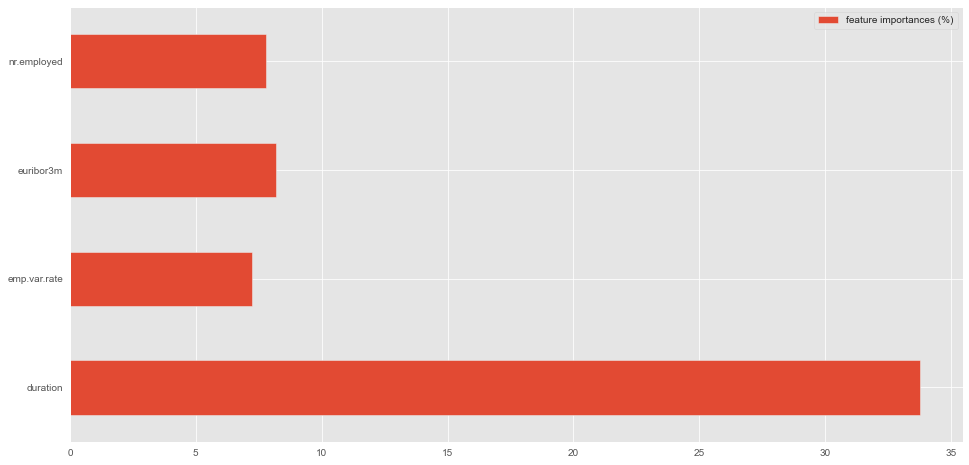

In [ ]:
fitur_df= pd.DataFrame(rf_fitur.feature_importances_*100, index=X_train.columns, columns=['feature importances (%)'])
fitur_df[fitur_df['feature importances (%)'] > 5].plot(kind='barh',figsize=(16,8))
fitur_df[fitur_df['feature importances (%)'] > 5]

## **Submission**

In [ ]:
test_pred = rf_model.predict(X_test)

In [ ]:
test_pred = rf_model.predict(X_test)
submission = pd.DataFrame({"id": id_test, "is_subscribed": test_pred})
submission.to_csv('test_finish.csv', index=False)

In [ ]:
submission

,id,is_subscribed
0,0,1
1,1,0
2,2,0
3,3,0
4,4,1
...,...,...
14614,14614,0
14615,14615,0
14616,14616,1
14617,14617,0
